# Karaoke Recommender

### DATA DICTIONARY

id (string)
>The Spotify ID for the track.

acousticness (float)
>A confidence measure from 0.0 to 1.0 of whether the track is acoustic. 1.0 represents high confidence the track is acoustic.

analysis_url (string)	
>An HTTP URL to access the full audio analysis of this track. An access token is required to access this data.

danceability (float)	
>Danceability describes how suitable a track is for dancing based on a combination of musical elements including tempo, rhythm stability, beat strength, and overall regularity. A value of 0.0 is least danceable and 1.0 is most danceable.

duration_ms (int)	
>The duration of the track in milliseconds.

energy (float)	
>Energy is a measure from 0.0 to 1.0 and represents a perceptual measure of intensity and activity.
Typically, energetic tracks feel fast, loud, and noisy. For example, death metal has high energy, while a Bach prelude scores low on the scale. Perceptual features contributing to this attribute include dynamic range, perceived loudness, timbre, onset rate, and general entropy.

instrumentalness (float)
>Predicts whether a track contains no vocals. "Ooh" and "aah" sounds are treated as instrumental in this context. Rap or spoken word tracks are clearly "vocal". The closer the instrumentalness value is to 1.0, the greater likelihood the track contains no vocal content. Values above 0.5 are intended to represent instrumental tracks, but confidence is higher as the value approaches 1.0.

key (int)	
>The key the track is in. Integers map to pitches using standard Pitch Class notation. E.g. 0 = C, 1 = C♯/D♭, 2 = D, and so on.

liveness (float)
>Detects the presence of an audience in the recording. Higher liveness values represent an increased probability that the track was performed live. A value above 0.8 provides strong likelihood that the track is live.

loudness (float)
>The overall loudness of a track in decibels (dB). Loudness values are averaged across the entire track and are useful for comparing relative loudness of tracks. Loudness is the quality of a sound that is the primary psychological correlate of physical strength (amplitude). Values typical range between -60 and 0 db.

mode (int)	
>Mode indicates the modality (major or minor) of a track, the type of scale from which its melodic content is derived. Major is represented by 1 and minor is 0.

speechiness (float)	
>Speechiness detects the presence of spoken words in a track. The more exclusively speech-like the recording (e.g. talk show, audio book, poetry), the closer to 1.0 the attribute value. Values above 0.66 describe tracks that are probably made entirely of spoken words. Values between 0.33 and 0.66 describe tracks that may contain both music and speech, either in sections or layered, including such cases as rap music. Values below 0.33 most likely represent music and other non-speech-like tracks.

tempo (float)	
>The overall estimated tempo of a track in beats per minute (BPM). In musical terminology, tempo is the speed or pace of a given piece and derives directly from the average beat duration.
time_signature	int	An estimated overall time signature of a track. The time signature (meter) is a notational convention to specify how many beats are in each bar (or measure).

track_href (string)	
>A link to the Web API endpoint providing full details of the track.

type (string)	
>The object type: "audio_features"

valence	(float)	
>A measure from 0.0 to 1.0 describing the musical positiveness conveyed by a track. Tracks with high valence sound more positive (e.g. happy, cheerful, euphoric), while tracks with low valence sound more negative (e.g. sad, depressed, angry).

In [2]:
import pandas as pd
import numpy as np

In [3]:
tks4 = pd.read_pickle('tks4.p')

In [4]:
tks4.head()

,Artist,Title,id,popularity
0,Frozen,Let It Go,0qcr5FMsEO85NAQjrlDRKo,65
1,Pharrell Williams,Happy,6NPVjNh8Jhru9xOmyQigds,74
2,Mark Ronson feat. Bruno Mars,Uptown Funk,5MjukdbL11ysj7TnEM2GPn,10
3,Taylor Swift,Shake It off,1j2sRZpFUzG6wPJGfRvet3,49
4,Meghan Trainor,All About That Bass,0ifSeVGUr7py5GggttDhXw,70


In [6]:
tks = tks4[tks4['Title'].str.contains("nan") == False]

In [7]:
tks.reset_index(drop=True, inplace=True)

In [8]:
tks = tks[tks['id'].str.contains('nan')==False]

USE ID TO GET AUDIO FEATURES FOR EACH SONG

In [9]:
# Get features for each song in tks

from __future__ import print_function    # (at top of module)
from spotipy.oauth2 import SpotifyClientCredentials
import json
import spotipy
import time
import sys

client_credentials_manager = SpotifyClientCredentials(client_id='9342202d7b4640c8aa49d83b62b570ba', client_secret = '9c08dfa4279348dda0d13d410a762728')
sp = spotipy.Spotify(client_credentials_manager=client_credentials_manager)
sp.trace=False

features = tks["id"].map(lambda x: sp.audio_features([x]))

retrying ...1secs
retrying ...1secs
retrying ...1secs
retrying ...1secs
retrying ...1secs
retrying ...1secs


In [10]:
features.head()

0    [{u'track_href': u'https://api.spotify.com/v1/...
1    [{u'track_href': u'https://api.spotify.com/v1/...
2    [{u'track_href': u'https://api.spotify.com/v1/...
3    [{u'track_href': u'https://api.spotify.com/v1/...
4    [{u'track_href': u'https://api.spotify.com/v1/...
Name: id, dtype: object

CONVERT & MERGE TO ONE DATAFRAME

In [11]:
f =[]
for d in features:
    for l in d:
        f.append(l)

In [12]:
f

[{u'acousticness': 0.556,
  u'analysis_url': u'https://api.spotify.com/v1/audio-analysis/0qcr5FMsEO85NAQjrlDRKo',
  u'danceability': 0.539,
  u'duration_ms': 223840,
  u'energy': 0.488,
  u'id': u'0qcr5FMsEO85NAQjrlDRKo',
  u'instrumentalness': 0,
  u'key': 8,
  u'liveness': 0.122,
  u'loudness': -6.864,
  u'mode': 1,
  u'speechiness': 0.0318,
  u'tempo': 137.073,
  u'time_signature': 4,
  u'track_href': u'https://api.spotify.com/v1/tracks/0qcr5FMsEO85NAQjrlDRKo',
  u'type': u'audio_features',
  u'uri': u'spotify:track:0qcr5FMsEO85NAQjrlDRKo',
  u'valence': 0.373},
 {u'acousticness': 0.286,
  u'analysis_url': u'https://api.spotify.com/v1/audio-analysis/6NPVjNh8Jhru9xOmyQigds',
  u'danceability': 0.652,
  u'duration_ms': 233305,
  u'energy': 0.757,
  u'id': u'6NPVjNh8Jhru9xOmyQigds',
  u'instrumentalness': 0,
  u'key': 1,
  u'liveness': 0.0886,
  u'loudness': -6.819,
  u'mode': 1,
  u'speechiness': 0.153,
  u'tempo': 159.911,
  u'time_signature': 4,
  u'track_href': u'https://api.spotif

In [13]:
# convert features to dataframe
af = pd.DataFrame(f)

In [14]:
af

,acousticness,analysis_url,danceability,duration_ms,energy,id,instrumentalness,key,liveness,loudness,mode,speechiness,tempo,time_signature,track_href,type,uri,valence
0,0.556000,https://api.spotify.com/v1/audio-analysis/0qcr...,0.539,223840,0.488,0qcr5FMsEO85NAQjrlDRKo,0.000000,8,0.1220,-6.864,1,0.0318,137.073,4,https://api.spotify.com/v1/tracks/0qcr5FMsEO85...,audio_features,spotify:track:0qcr5FMsEO85NAQjrlDRKo,0.373
1,0.286000,https://api.spotify.com/v1/audio-analysis/6NPV...,0.652,233305,0.757,6NPVjNh8Jhru9xOmyQigds,0.000000,1,0.0886,-6.819,1,0.1530,159.911,4,https://api.spotify.com/v1/tracks/6NPVjNh8Jhru...,audio_features,spotify:track:6NPVjNh8Jhru9xOmyQigds,0.962
2,0.041700,https://api.spotify.com/v1/audio-analysis/5Mju...,0.823,271360,0.498,5MjukdbL11ysj7TnEM2GPn,0.000000,0,0.1070,-7.257,1,0.1020,115.046,4,https://api.spotify.com/v1/tracks/5MjukdbL11ys...,audio_features,spotify:track:5MjukdbL11ysj7TnEM2GPn,0.638
3,0.003100,https://api.spotify.com/v1/audio-analysis/1j2s...,0.598,217602,0.909,1j2sRZpFUzG6wPJGfRvet3,0.004990,6,0.0734,-4.686,1,0.0559,160.046,4,https://api.spotify.com/v1/tracks/1j2sRZpFUzG6...,audio_features,spotify:track:1j2sRZpFUzG6wPJGfRvet3,0.966
4,0.047600,https://api.spotify.com/v1/audio-analysis/0ifS...,0.811,188754,0.879,0ifSeVGUr7py5GggttDhXw,0.000002,9,0.1090,-3.724,1,0.0514,134.064,4,https://api.spotify.com/v1/tracks/0ifSeVGUr7py...,audio_features,spotify:track:0ifSeVGUr7py5GggttDhXw,0.962
5,0.474000,https://api.spotify.com/v1/audio-analysis/34gC...,0.781,281560,0.445,34gCuhDGsG4bRPIf9bb02f,0.000000,2,0.1840,-6.061,1,0.0295,78.998,4,https://api.spotify.com/v1/tracks/34gCuhDGsG4b...,audio_features,spotify:track:34gCuhDGsG4bRPIf9bb02f,0.584
6,0.921000,https://api.spotify.com/v1/audio-analysis/2muX...,0.754,235052,0.232,2muXrVYHVCUOuth8MePP3K,0.915000,10,0.0968,-19.885,1,0.1180,95.986,4,https://api.spotify.com/v1/tracks/2muXrVYHVCUO...,audio_features,spotify:track:2muXrVYHVCUOuth8MePP3K,0.950
7,0.568000,https://api.spotify.com/v1/audio-analysis/5Db9...,0.479,172724,0.419,5Db9VIdDsN5yu3Eu7CT0i4,0.000217,0,0.1100,-6.517,1,0.0389,85.014,4,https://api.spotify.com/v1/tracks/5Db9VIdDsN5y...,audio_features,spotify:track:5Db9VIdDsN5yu3Eu7CT0i4,0.174
8,0.850000,https://api.spotify.com/v1/audio-analysis/2yi7...,0.359,206507,0.121,2yi7HZrBOC4bMUSTcs4VK6,0.000280,3,0.2550,-15.512,1,0.0481,146.271,3,https://api.spotify.com/v1/tracks/2yi7HZrBOC4b...,audio_features,spotify:track:2yi7HZrBOC4bMUSTcs4VK6,0.157
9,0.622000,https://api.spotify.com/v1/audio-analysis/0ej0...,0.741,216907,0.631,0ej0YkMM8E0WOWuWVZliDh,0.000071,2,0.0762,-9.502,1,0.0638,124.333,4,https://api.spotify.com/v1/tracks/0ej0YkMM8E0W...,audio_features,spotify:track:0ej0YkMM8E0WOWuWVZliDh,0.627


In [15]:
# Join dataframe tks (karaoke songs) and dataframe features on id
af = pd.merge(tks,af, on=['id','id'])

In [16]:
af.head()

,Artist,Title,id,popularity,acousticness,analysis_url,danceability,duration_ms,energy,instrumentalness,...,liveness,loudness,mode,speechiness,tempo,time_signature,track_href,type,uri,valence
0,Frozen,Let It Go,0qcr5FMsEO85NAQjrlDRKo,65,0.556,https://api.spotify.com/v1/audio-analysis/0qcr...,0.539,223840,0.488,0.0,...,0.1220,-6.864,1,0.0318,137.073,4,https://api.spotify.com/v1/tracks/0qcr5FMsEO85...,audio_features,spotify:track:0qcr5FMsEO85NAQjrlDRKo,0.373
1,Frozen,Let It Go,0qcr5FMsEO85NAQjrlDRKo,65,0.556,https://api.spotify.com/v1/audio-analysis/0qcr...,0.539,223840,0.488,0.0,...,0.1220,-6.864,1,0.0318,137.073,4,https://api.spotify.com/v1/tracks/0qcr5FMsEO85...,audio_features,spotify:track:0qcr5FMsEO85NAQjrlDRKo,0.373
2,Idina Menzel,Let It Go,0qcr5FMsEO85NAQjrlDRKo,65,0.556,https://api.spotify.com/v1/audio-analysis/0qcr...,0.539,223840,0.488,0.0,...,0.1220,-6.864,1,0.0318,137.073,4,https://api.spotify.com/v1/tracks/0qcr5FMsEO85...,audio_features,spotify:track:0qcr5FMsEO85NAQjrlDRKo,0.373
3,Idina Menzel,Let It Go,0qcr5FMsEO85NAQjrlDRKo,65,0.556,https://api.spotify.com/v1/audio-analysis/0qcr...,0.539,223840,0.488,0.0,...,0.1220,-6.864,1,0.0318,137.073,4,https://api.spotify.com/v1/tracks/0qcr5FMsEO85...,audio_features,spotify:track:0qcr5FMsEO85NAQjrlDRKo,0.373
4,Pharrell Williams,Happy,6NPVjNh8Jhru9xOmyQigds,74,0.286,https://api.spotify.com/v1/audio-analysis/6NPV...,0.652,233305,0.757,0.0,...,0.0886,-6.819,1,0.1530,159.911,4,https://api.spotify.com/v1/tracks/6NPVjNh8Jhru...,audio_features,spotify:track:6NPVjNh8Jhru9xOmyQigds,0.962


In [17]:
af.drop_duplicates('id', inplace=True)

In [18]:
af.reset_index(drop=True, inplace=True)

In [19]:
af[af.duplicated('Title')].sort_values(by='Title').head()

,Artist,Title,id,popularity,acousticness,analysis_url,danceability,duration_ms,energy,instrumentalness,...,liveness,loudness,mode,speechiness,tempo,time_signature,track_href,type,uri,valence
2459,Michelle Simonal,(I Can't Get No) Satisfaction,5KGkkqaXYVcvKY3XaRdBaK,40,0.47100,https://api.spotify.com/v1/audio-analysis/5KGk...,0.847,212027,0.446,0.04150,...,0.2690,-11.573,1,0.0584,119.990,4,https://api.spotify.com/v1/tracks/5KGkkqaXYVcv...,audio_features,spotify:track:5KGkkqaXYVcvKY3XaRdBaK,0.581
2585,Carole King,(You Make Me Feel Like) A Natural Woman,0LXljhKMUgoLv8tLwZ1hmf,55,0.95300,https://api.spotify.com/v1/audio-analysis/0LXl...,0.624,229067,0.158,0.00135,...,0.1120,-13.059,1,0.0289,85.492,3,https://api.spotify.com/v1/tracks/0LXljhKMUgoL...,audio_features,spotify:track:0LXljhKMUgoLv8tLwZ1hmf,0.291
3710,Junkie XL,A Little Less Conversation,49Mxveaa2JBEA55DLiuYix,11,0.00146,https://api.spotify.com/v1/audio-analysis/49Mx...,0.590,222232,0.957,0.00121,...,0.1080,-5.494,1,0.1040,130.026,4,https://api.spotify.com/v1/tracks/49Mxveaa2JBE...,audio_features,spotify:track:49Mxveaa2JBEA55DLiuYix,0.755
3545,Kelly Clarkson,A Moment Like This,4kvdX9zzsix7jYHsRVkVUH,54,0.16300,https://api.spotify.com/v1/audio-analysis/4kvd...,0.414,228280,0.572,0.00000,...,0.1150,-3.918,1,0.0311,145.184,4,https://api.spotify.com/v1/tracks/4kvdX9zzsix7...,audio_features,spotify:track:4kvdX9zzsix7jYHsRVkVUH,0.154
1238,Joe Cocker,A Whiter Shade of Pale,1kU9hMMuf2JV08OpuwIVWq,20,0.12300,https://api.spotify.com/v1/audio-analysis/1kU9...,0.387,322826,0.403,0.04790,...,0.0623,-9.334,1,0.0260,172.992,3,https://api.spotify.com/v1/tracks/1kU9hMMuf2JV...,audio_features,spotify:track:1kU9hMMuf2JV08OpuwIVWq,0.147


In [20]:
# pickle dataframe
import pickle

with open('karaoke_songs4.pkl', 'w') as ks:
    pickle.dump(af, ks)

In [21]:
# open pickled dataframe
with open('karaoke_songs4.pkl', 'r') as ks:
    af = pickle.load(ks)

In [23]:
# strip spaces
af['Title'] = af['Title'].str.strip()
af['Artist'] = af['Artist'].str.strip()

In [24]:
# check unique values for column 'type'
af['type'].unique()

array([u'audio_features'], dtype=object)

In [25]:
# check unique values for column 'mode'
af['mode'].unique()

array([1, 0])

In [26]:
# drop columns ('analysis_url','track_href','type','uri')
af.drop(['analysis_url','track_href','type','uri'],axis=1,inplace=True)

In [27]:
af['popularity']=af['popularity'].astype('int')

In [28]:
# check types for columns
af.dtypes

Artist               object
Title                object
id                   object
popularity            int64
acousticness        float64
danceability        float64
duration_ms           int64
energy              float64
instrumentalness    float64
key                   int64
liveness            float64
loudness            float64
mode                  int64
speechiness         float64
tempo               float64
time_signature        int64
valence             float64
dtype: object

In [29]:
# Check for nulls
af[pd.isnull(af).any(axis=1)]

,Artist,Title,id,popularity,acousticness,danceability,duration_ms,energy,instrumentalness,key,liveness,loudness,mode,speechiness,tempo,time_signature,valence


In [30]:
# Describe audio features 
af.describe()

,popularity,acousticness,danceability,duration_ms,energy,instrumentalness,key,liveness,loudness,mode,speechiness,tempo,time_signature,valence
count,3744.000000,3744.000000,3744.000000,3744.000000,3744.000000,3744.000000,3744.000000,3744.000000,3744.000000,3744.000000,3744.000000,3744.000000,3744.000000,3744.000000
mean,49.709402,0.402009,0.554665,225437.063568,0.545175,0.031831,5.217949,0.185367,-9.090964,0.762286,0.056613,119.834472,3.888355,0.536411
std,17.878354,0.318398,0.161005,66003.432604,0.232716,0.137991,3.527540,0.157987,3.873841,0.425740,0.057055,29.491289,0.398143,0.259172
min,0.000000,0.000002,0.080100,36578.000000,0.005960,0.000000,0.000000,0.017300,-29.614000,0.000000,0.022400,35.419000,1.000000,0.037700
25%,40.000000,0.088275,0.447750,183843.250000,0.360750,0.000000,2.000000,0.094575,-11.540000,1.000000,0.031000,97.092250,4.000000,0.319000
50%,53.000000,0.364000,0.566000,218753.000000,0.547000,0.000007,5.000000,0.125000,-8.545000,1.000000,0.037800,119.007500,4.000000,0.541000
75%,63.000000,0.694250,0.671000,257200.000000,0.734000,0.000470,8.000000,0.218000,-6.077000,1.000000,0.054100,136.649750,4.000000,0.757250
max,100.000000,0.996000,0.978000,952720.000000,0.994000,0.972000,11.000000,0.991000,-0.698000,1.000000,0.673000,216.126000,5.000000,1.000000


In [91]:
afp = af[['Title','Artist','popularity']].sort_values('popularity', ascending = False).head(10)
afp

,Title,Artist,popularity
110,Closer,The Chainsmokers,100
161,Heathens,Twenty One Pilots,93
363,Don't Let Me Down,The Chainsmokers,93
153,Say You Won't Let Go,James Arthur,92
316,Ride,Twenty One Pilots,91
351,This Is What You Came For,Calvin Harris,91
378,The Greatest,Sia,90
179,Let Me Love You,DJ Snake,90
413,"I Hate U, I Love U",Gnash,90
1765,Alarm,Anne-Marie,90


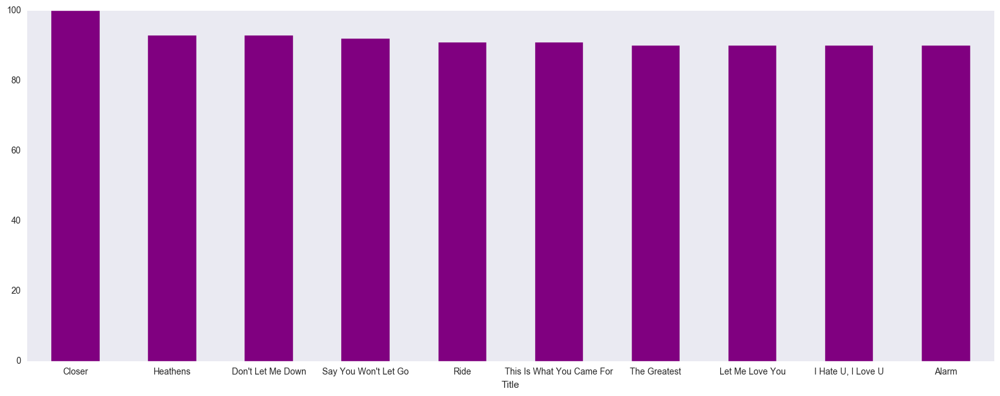

In [98]:
fig, ax = plt.subplots()
afp.plot(kind='bar', x='Title',y='popularity', color='purple', ax=ax,figsize=(16,8))
plt.tight_layout()
ax.set_xticklabels(ax.xaxis.get_majorticklabels(),rotation=360);
ax.legend_.remove()

In [31]:
# Correlation between various features
af_corr = af.corr()
af_corr

,popularity,acousticness,danceability,duration_ms,energy,instrumentalness,key,liveness,loudness,mode,speechiness,tempo,time_signature,valence
popularity,1.000000,-0.290821,0.142893,0.102623,0.258728,-0.309189,0.015772,-0.065836,0.324382,-0.083490,0.074887,0.010469,0.086571,0.041148
acousticness,-0.290821,1.000000,-0.330990,-0.209791,-0.719404,0.048034,-0.043203,-0.028508,-0.515177,0.114277,-0.096479,-0.147109,-0.204334,-0.323771
danceability,0.142893,-0.330990,1.000000,-0.077653,0.300431,-0.016499,0.009969,-0.094728,0.208165,-0.105894,0.162649,-0.085809,0.219536,0.563429
duration_ms,0.102623,-0.209791,-0.077653,1.000000,0.096258,-0.007725,0.034078,0.011247,0.062326,-0.091947,0.003895,-0.018970,0.027190,-0.208035
energy,0.258728,-0.719404,0.300431,0.096258,1.000000,-0.097118,0.041705,0.149718,0.752538,-0.089197,0.173511,0.209953,0.224113,0.505809
instrumentalness,-0.309189,0.048034,-0.016499,-0.007725,-0.097118,1.000000,0.010874,-0.021372,-0.202172,-0.006248,-0.021649,-0.009994,-0.019364,-0.028425
key,0.015772,-0.043203,0.009969,0.034078,0.041705,0.010874,1.000000,-0.011487,0.025879,-0.096246,0.034302,0.002542,0.005346,0.012420
liveness,-0.065836,-0.028508,-0.094728,0.011247,0.149718,-0.021372,-0.011487,1.000000,0.075022,0.033779,0.149266,0.029773,0.000515,0.055050
loudness,0.324382,-0.515177,0.208165,0.062326,0.752538,-0.202172,0.025879,0.075022,1.000000,-0.062694,0.093145,0.132249,0.151086,0.229163
mode,-0.083490,0.114277,-0.105894,-0.091947,-0.089197,-0.006248,-0.096246,0.033779,-0.062694,1.000000,-0.105188,0.018606,-0.014760,-0.010915


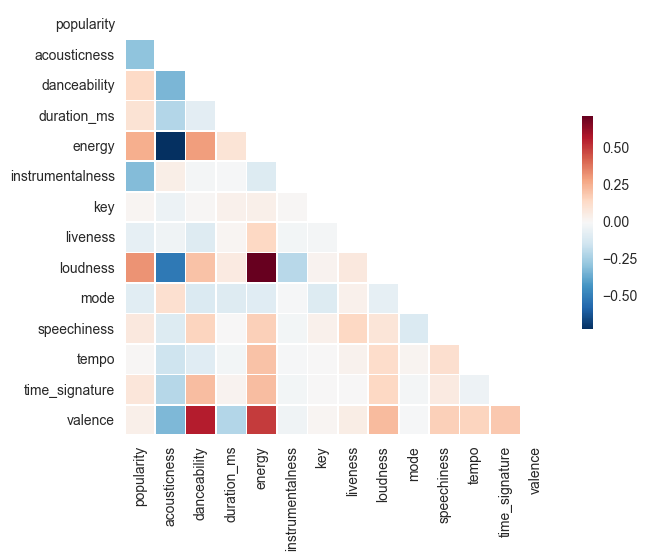

In [32]:
import seaborn as sns
import matplotlib.pyplot as plt
plt.style.use('ggplot')
%matplotlib inline

sns.set(style="white")

# Generate a mask for the upper triangle
mask = np.zeros_like(af_corr, dtype=np.bool)
mask[np.triu_indices_from(mask)] = True

# Draw the heatmap with the mask and correct aspect ratio
sns.heatmap(af_corr, mask=mask, vmax=.3,
            square=True, linewidths=.5, cbar_kws={"shrink": .5})

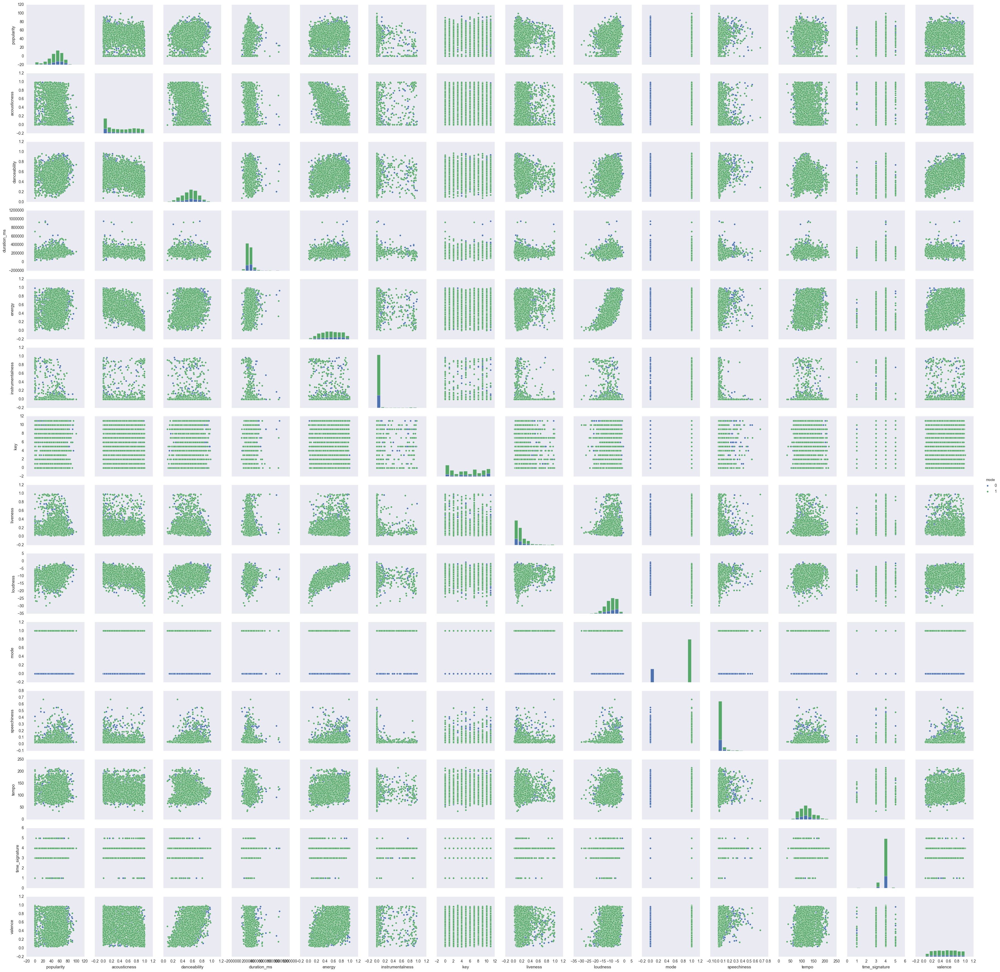

In [33]:
sns.set(style="dark")
sns.pairplot(af, hue='mode');

In [93]:
afe = af[['Title','Artist','energy']].sort_values('energy', ascending = False).head(10)
afe

,Title,Artist,energy
2831,Holy Diver,Ronnie James Dio,0.994
3378,Spice Up Your Life,Spice Girls,0.993
1696,Ace Of Spades,Motörhead,0.991
766,Country Roads,Hermes House Band,0.990
1498,Pokémon,Cartoons,0.990
1488,Rock and Roll Christmas,George Thorogood,0.990
2800,Jingle Bells (Bass),Basshunter,0.989
1270,Last Christmas,Cascada,0.984
1691,Smooth Criminal,Michael Jackson,0.981
2259,"Hey, Good Lookin'","Hank Williams, Jr.",0.980


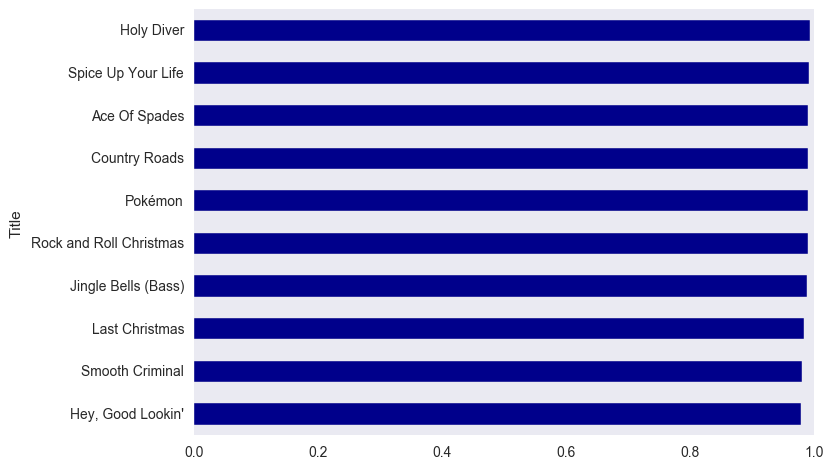

In [36]:
fig, ax = plt.subplots()
afe.plot(kind='barh', x='Title',y='energy', color='darkblue', ax=ax)
plt.gca().invert_yaxis()
ax.legend_.remove()

In [94]:
afd = af[['Title','Artist','danceability']].sort_values('danceability', ascending = False).head(10)
afd

,Title,Artist,danceability
66,Ice Ice Baby,Vanilla Ice,0.978
2158,Hot In Herre,Nelly,0.965
1786,Humpty Dumpty,Nursery Rhyme,0.965
2628,Anaconda,Nicki Minaj,0.965
3207,Just Lose It,Eminem,0.963
901,Kingston Town,UB40,0.956
1365,Another One Bites The Dust,Queen,0.951
817,The Real Slim Shady,Eminem,0.950
1485,Bust A Move,Young MC,0.944
1835,Jamming,Bob Marley,0.941


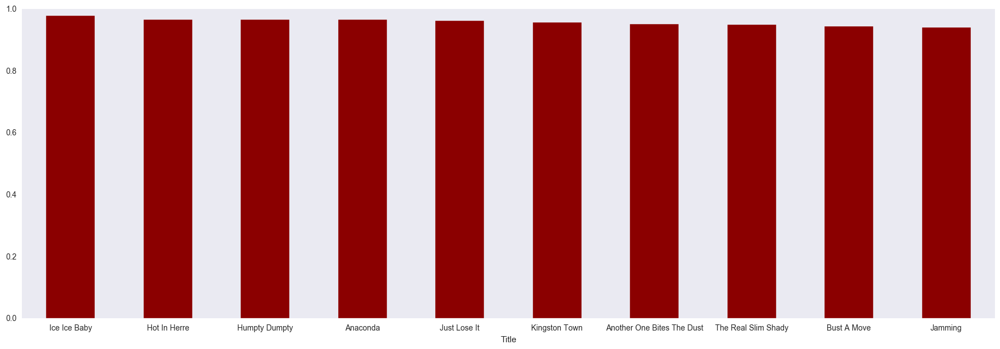

In [38]:
fig, ax = plt.subplots()
afd.plot(kind='bar', x='Title',y='danceability', color='darkred', ax=ax, legend=False, figsize=(18,8))
plt.tight_layout()
ax.set_xticklabels(ax.xaxis.get_majorticklabels(),rotation=360);

In [95]:
aft = af[['Title','Artist','tempo']].sort_values('tempo', ascending = False).head(10)
aft

,Title,Artist,tempo
527,Alphabet Song,Nursery Rhyme,216.126
78,You're The One That I Want,Grease,213.840
1631,"Lovin', Touchin', Squeezin'",Journey,211.261
3266,That's Life,Michael Bublé,209.648
1501,It's Too Late,Carole King,208.282
3613,It Hurt So Bad,Susan Tedeschi,207.934
3101,Love Yourself,Postmodern Jukebox,207.659
1330,Dancing In The Sky,Dani and Lizzy,207.508
773,Somethin' Stupid,Frank Sinatra,207.431
3042,Tom Jones Medley,De Toppers,207.185


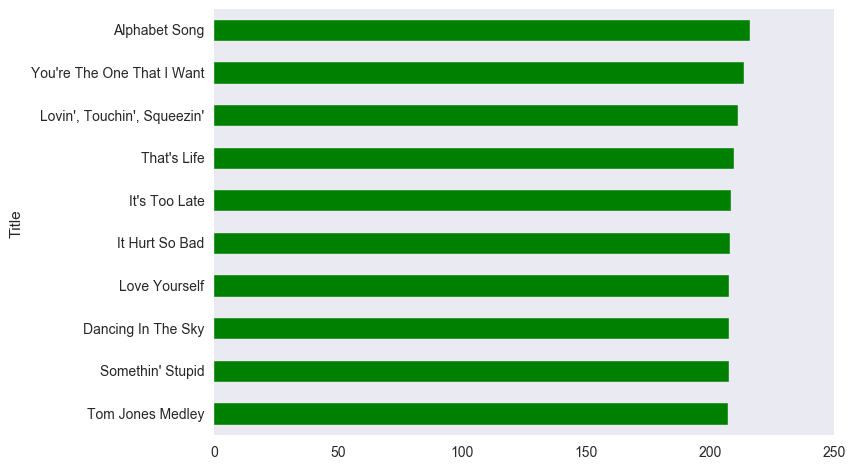

In [43]:
fig, ax = plt.subplots()
aft.plot(kind='barh', x='Title',y='tempo', color='green', ax=ax)
plt.gca().invert_yaxis()
ax.legend_.remove()

# DATA MINING

In [45]:
import math
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA 
from sklearn.preprocessing import LabelEncoder

In [46]:
af.T

,0,1,2,3,4,5,6,7,8,9,...,3734,3735,3736,3737,3738,3739,3740,3741,3742,3743
Artist,Frozen,Pharrell Williams,Mark Ronson feat. Bruno Mars,Taylor Swift,Meghan Trainor,Ed Sheeran,Taylor Swift,Sam Smith,Frozen,Grease,...,Deee-Lite,Jay and The Americans,Genesis,Little River Band,Bread,The Deele,Mr. Mister,Third Eye Blind,Stevie Ray Vaughan,Wiz Khalifa
Title,Let It Go,Happy,Uptown Funk,Shake It off,All About That Bass,Thinking Out Loud,Blank Space,Stay With Me,Do You Want To Build A Snowman?,Summer Nights,...,Groove Is In The Heart,Come A Little Bit Closer,That's All,Reminiscing,If,Two Occasions,Broken Wings,Jumper,The House Is Rockin',"Young, Wild & Free"
id,0qcr5FMsEO85NAQjrlDRKo,6NPVjNh8Jhru9xOmyQigds,5MjukdbL11ysj7TnEM2GPn,1j2sRZpFUzG6wPJGfRvet3,0ifSeVGUr7py5GggttDhXw,34gCuhDGsG4bRPIf9bb02f,2muXrVYHVCUOuth8MePP3K,5Db9VIdDsN5yu3Eu7CT0i4,2yi7HZrBOC4bMUSTcs4VK6,0ej0YkMM8E0WOWuWVZliDh,...,2UVLuddklEVak5PXgC7baA,252YuUdUaC5OojaBU0H1CP,2zFdsAIk9r2Mi7Lmm1w3sM,4NoLnnJvVK5tpOdlNQI6RG,1Fu3gq55GH3P6OF352rEIc,0mt80ksFAwPHXyAlArU5Yc,78FHUZRbFDCG6VkRAQdFLm,3354J49VpkbZJho7Ztdzpw,5DUi0QVP5Lgm7lwVE0r9ZP,5HQVUIKwCEXpe7JIHyY734
popularity,65,74,10,49,70,84,40,74,62,53,...,60,41,51,44,55,43,56,64,51,79
acousticness,0.556,0.286,0.0417,0.0031,0.0476,0.474,0.921,0.568,0.85,0.622,...,0.023,0.52,0.224,0.593,0.907,0.0259,0.134,0.0129,0.107,0.0525
danceability,0.539,0.652,0.823,0.598,0.811,0.781,0.754,0.479,0.359,0.741,...,0.763,0.636,0.697,0.555,0.406,0.543,0.286,0.599,0.336,0.715
duration_ms,223840,233305,271360,217602,188754,281560,235052,172724,206507,216907,...,234293,166667,265533,249173,153560,258427,343933,272973,144440,207333
energy,0.488,0.757,0.498,0.909,0.879,0.445,0.232,0.419,0.121,0.631,...,0.858,0.684,0.627,0.497,0.189,0.667,0.5,0.543,0.941,0.655
instrumentalness,0,0,0,0.00499,1.91e-06,0,0.915,0.000217,0.00028,7.1e-05,...,0.149,0.0015,0.0138,7.41e-05,0.000171,3.96e-05,4.57e-05,0.00193,0.00431,0
key,8,1,0,6,9,2,10,0,3,2,...,6,3,4,7,9,9,1,0,4,0


In [47]:
x = af.iloc[:,4:]
X = StandardScaler().fit_transform(x)

In [48]:
af_norm = pd.DataFrame(X, columns=[x.columns])

/Users/andrewjeong/anaconda/lib/python2.7/site-packages/seaborn/categorical.py:2171: UserWarning: The boxplot API has been changed. Attempting to adjust your arguments for the new API (which might not work). Please update your code. See the version 0.6 release notes for more info.
  warnings.warn(msg, UserWarning)


(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12]),
 <a list of 13 Text xticklabel objects>)

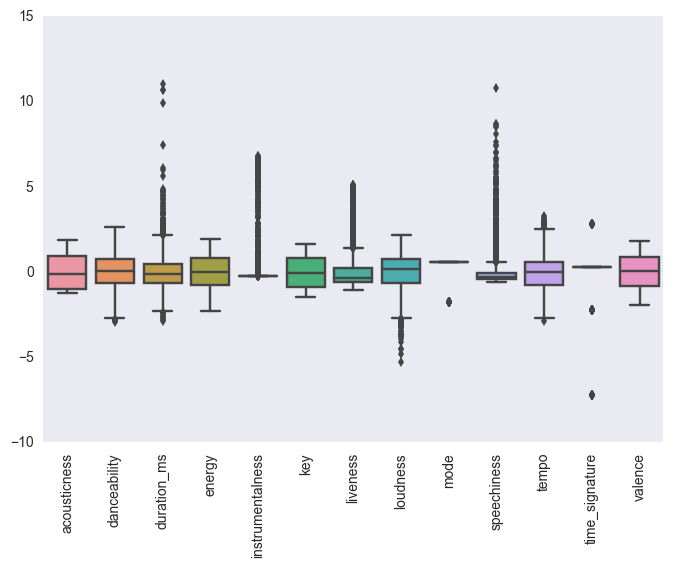

In [49]:
sns.boxplot(af_norm)
plt.xticks(rotation=90) 

# MODELING

In [166]:
from sklearn import linear_model
from sklearn.metrics import r2_score
from sklearn.metrics import mean_squared_error
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import Ridge
from sklearn.linear_model import Lasso
from sklearn import cross_validation

### Vanilla Linear Regression

In [429]:
np.min(af['popularity'])

0

In [430]:
np.max(af['popularity'])

100

In [167]:
X = X
y = af['popularity']

In [168]:

lm = linear_model.LinearRegression()
lm.fit(X,y)

pred = lm.predict(X)
print ("r2 = ",r2_score(y, pred))
print ("MSE =", mean_squared_error(y, pred))
print ("RMSE =", round(np.sqrt(mean_squared_error(y, pred)), 2))

print ()
print ("Coefficients:")

for i,j in zip(x.columns, lm.coef_):
    print (i, ':', j)

r2 =  0.217557714393
MSE = 250.02956383
RMSE = 15.81

Coefficients:
acousticness : -3.35590242607
danceability : 1.38447815537
duration_ms : 0.589988009641
energy : -0.449633337445
instrumentalness : -4.73305199104
key : -0.00417668319488
liveness : -1.45330296564
loudness : 3.52874115901
mode : -0.619898982767
speechiness : 0.921300220713
tempo : -0.353740141823
time_signature : 0.285546898963
valence : -1.80822681213


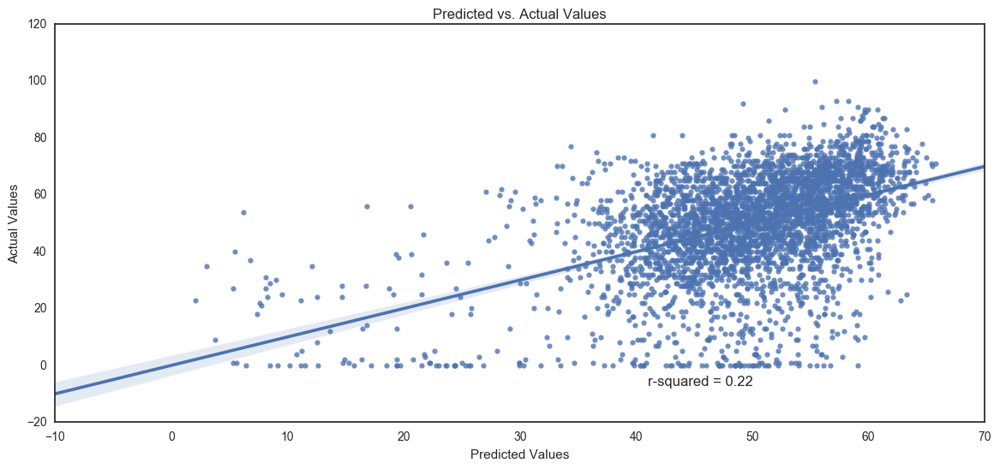

In [169]:
import matplotlib.pyplot as plt
import seaborn as sns
plt.style.use('seaborn-white')
%matplotlib inline

ax = sns.regplot(pred, y)
ax.figure.set_figheight(6)
ax.figure.set_figwidth(14)
plt.annotate('r-squared = ' + str(round(r2_score(y, pred),2)), xy=(41,-7), fontsize=12)
ax.set_ylabel('Actual Values')
ax.set_xlabel('Predicted Values')
ax.set_title('Predicted vs. Actual Values');

### Cross Validation - Lasso/ Ridge

In [170]:
from sklearn.cross_validation import train_test_split
from sklearn.cross_validation import cross_val_predict
from sklearn.model_selection import cross_val_score


X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=.33)

#### Lasso

In [171]:
lasso = linear_model.Lasso(alpha=.01)
tts_model = lasso_tts.fit(X_train, y_train)

tts_lasso_r2 =  r2_score(y_true=y_test, y_pred=tts_model.predict(X_test))

print ('tts lasso r2:', tts_lasso_r2)

tts lasso r2: 0.206783769599


In [172]:
cross_val_score(lasso, X, y, n_jobs=1, cv=5)

array([ 0.04119574,  0.10678764,  0.24503977,  0.20838602,  0.00162731])

In [173]:
cross_val_score(lasso, X, y, n_jobs=1, cv=5).mean()

0.12060729549439986

In [174]:
cross_val_score(lasso, X, y, n_jobs=1, cv=5,
                scoring='mean_squared_error')

/Users/andrewjeong/anaconda/lib/python2.7/site-packages/sklearn/metrics/scorer.py:90: DeprecationWarning: Scoring method mean_squared_error was renamed to neg_mean_squared_error in version 0.18 and will be removed in 0.20.
  sample_weight=sample_weight)
/Users/andrewjeong/anaconda/lib/python2.7/site-packages/sklearn/metrics/scorer.py:90: DeprecationWarning: Scoring method mean_squared_error was renamed to neg_mean_squared_error in version 0.18 and will be removed in 0.20.
  sample_weight=sample_weight)
/Users/andrewjeong/anaconda/lib/python2.7/site-packages/sklearn/metrics/scorer.py:90: DeprecationWarning: Scoring method mean_squared_error was renamed to neg_mean_squared_error in version 0.18 and will be removed in 0.20.
  sample_weight=sample_weight)
/Users/andrewjeong/anaconda/lib/python2.7/site-packages/sklearn/metrics/scorer.py:90: DeprecationWarning: Scoring method mean_squared_error was renamed to neg_mean_squared_error in version 0.18 and will be removed in 0.20.
  sample_weight

array([-387.24833665, -218.88503951, -219.9496911 , -190.4341301 ,
       -311.32768076])

In [175]:
cross_val_score(lasso, X, y, n_jobs=1, cv=5,
                scoring='mean_squared_error').mean()

/Users/andrewjeong/anaconda/lib/python2.7/site-packages/sklearn/metrics/scorer.py:90: DeprecationWarning: Scoring method mean_squared_error was renamed to neg_mean_squared_error in version 0.18 and will be removed in 0.20.
  sample_weight=sample_weight)
/Users/andrewjeong/anaconda/lib/python2.7/site-packages/sklearn/metrics/scorer.py:90: DeprecationWarning: Scoring method mean_squared_error was renamed to neg_mean_squared_error in version 0.18 and will be removed in 0.20.
  sample_weight=sample_weight)
/Users/andrewjeong/anaconda/lib/python2.7/site-packages/sklearn/metrics/scorer.py:90: DeprecationWarning: Scoring method mean_squared_error was renamed to neg_mean_squared_error in version 0.18 and will be removed in 0.20.
  sample_weight=sample_weight)
/Users/andrewjeong/anaconda/lib/python2.7/site-packages/sklearn/metrics/scorer.py:90: DeprecationWarning: Scoring method mean_squared_error was renamed to neg_mean_squared_error in version 0.18 and will be removed in 0.20.
  sample_weight

-265.56897562362428

#### Ridge

In [176]:
rcv = linear_model.RidgeCV(alphas=(.001, .001, .01, .1, .5, 1, 5, 10),store_cv_values=True,)

In [177]:
rcv_model = rcv.fit(X, y)

In [178]:
rcv_model.score(X, y)

0.21755585850544745

In [179]:
rcv_model.alpha_

10.0

In [180]:
abs(rcv_model.coef_).mean()

1.4916906347082646

In [181]:
cross_val_predict(rcv_model, X, y, cv=5)

array([ 49.40619355,  51.80946393,  58.3611363 , ...,  55.17838192,
        47.29193521,  61.22876053])

## KMEANS

In [ ]:
from sklearn.metrics import pairwise_distances
from sklearn import cluster, preprocessing, metrics

In [182]:
k = 10
kmeans = cluster.KMeans(n_clusters=k)
kmeans.fit(X)

KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
    n_clusters=10, n_init=10, n_jobs=1, precompute_distances='auto',
    random_state=None, tol=0.0001, verbose=0)

In [183]:
labels = kmeans.labels_
centroids = kmeans.cluster_centers_
inertia = kmeans.inertia_

In [184]:
centroids

array([[-0.80314815,  0.74125796, -0.06934408,  0.85494073, -0.16915384,
        -0.01243003, -0.17859983,  0.61847768,  0.55842907, -0.11916503,
        -0.14923011,  0.26923827,  0.76393622],
       [ 0.62006015,  0.50291808, -0.76398007, -0.44341903, -0.14314608,
        -0.2378288 , -0.15069925, -0.46737864,  0.43120147, -0.1442618 ,
        -0.11113666,  0.25615858,  0.65861072],
       [-0.33088783, -0.32816405,  0.83081533,  0.02742205, -0.17801723,
        -0.10377244, -0.19299328,  0.33753531,  0.48351259, -0.33438863,
        -0.24341121,  0.25756419, -0.83923542],
       [ 0.85465919, -0.88020074, -0.05102168, -0.98629813, -0.16024519,
        -0.01680321, -0.12519791, -0.62318948,  0.10125589, -0.36490343,
         0.03087606, -2.57750694, -0.88138107],
       [ 0.2743154 , -0.1025163 , -0.11399118, -0.57553437,  5.31918813,
         0.02427589, -0.16498549, -1.04028429, -0.02886263, -0.11886245,
        -0.0251748 , -0.07840403, -0.22386762],
       [-0.52734765, -0.547268

In [199]:
metrics.silhouette_score(X, labels, metric='euclidean')

0.12035613815588717

In [200]:
Xk = pd.DataFrame(X)

In [201]:
Xk['cluster']= pd.Series(labels)

In [234]:
Xk['cluster']= Xk['cluster'].astype(float)

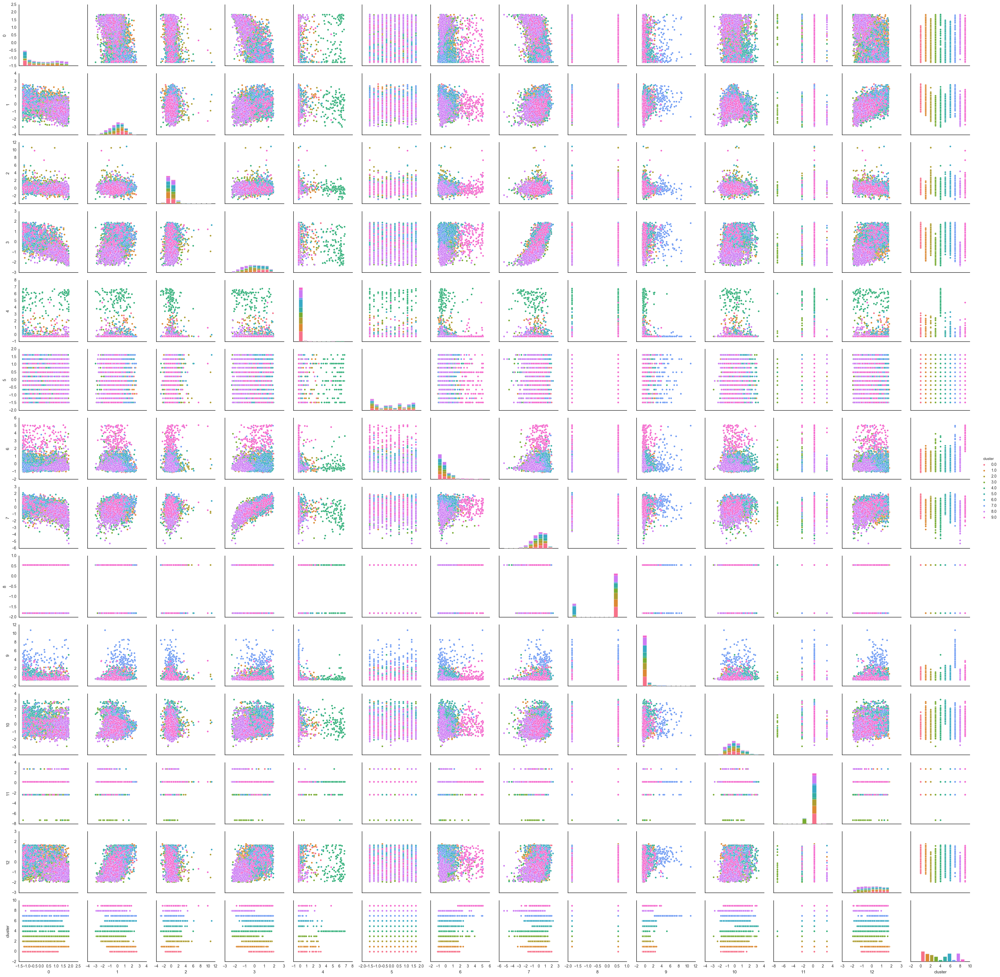

In [236]:
sns.pairplot(Xk, hue='cluster')

## PCA

In [50]:
from sklearn.decomposition import PCA

pca = PCA(n_components=13)
X_pca = pca.fit_transform(X)

In [51]:
pca.explained_variance_ratio_

array([ 0.23530724,  0.10695845,  0.09414721,  0.08735605,  0.0784789 ,
        0.07683682,  0.07161607,  0.06621924,  0.06018519,  0.0523463 ,
        0.03151063,  0.02951802,  0.00951989])

In [52]:
cumulvarExpl = pca.explained_variance_ratio_.cumsum()
cumulvarExpl

array([ 0.23530724,  0.34226568,  0.43641289,  0.52376894,  0.60224784,
        0.67908466,  0.75070073,  0.81691997,  0.87710516,  0.92945146,
        0.96096209,  0.99048011,  1.        ])

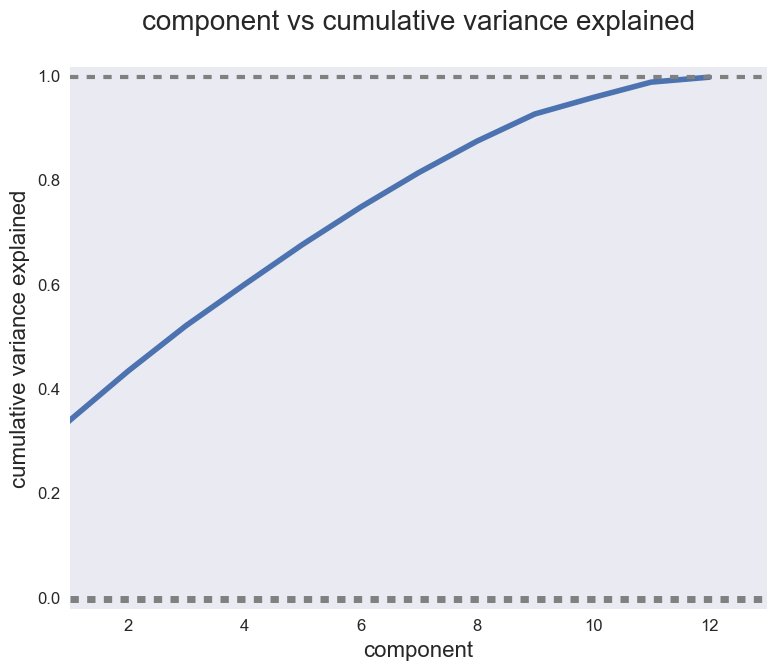

In [53]:
plt.figure(figsize=(9,7))

component_number = range(13)

plt.plot(component_number, cumulvarExpl, lw=4)

plt.axhline(y=0, linewidth=5, color='grey', ls='dashed')
plt.axhline(y=1, linewidth=3, color='grey', ls='dashed')


ax = plt.gca()
ax.set_xlim([1,13])
ax.set_ylim([-.02,1.02])

ax.set_ylabel('cumulative variance explained', fontsize=16)
ax.set_xlabel('component', fontsize=16)

for tick in ax.xaxis.get_major_ticks():
    tick.label.set_fontsize(12) 
    
for tick in ax.yaxis.get_major_ticks():
    tick.label.set_fontsize(12) 
    
ax.set_title('component vs cumulative variance explained\n', fontsize=20)

plt.show()

In [54]:
Xt = pd.DataFrame(X_pca, columns=['PC1','PC2','PC3','PC4','PC5','PC6','PC7','PC8','PC9','PC10','PC11','PC12','PC13'])
Xt.head()

,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,PC11,PC12,PC13
0,0.333809,0.387769,-0.049529,-0.404076,-0.598277,-0.452278,-0.746897,-0.701272,-0.099733,-0.207102,0.618481,-0.559218,0.051384
1,-2.102316,-0.763552,-1.260311,0.056020,-0.362455,0.428267,1.413935,-1.135445,0.798221,-0.181226,0.332833,0.587422,0.101452
2,-1.365425,-0.637567,0.331456,-0.786878,0.632743,0.704275,1.379038,-0.395879,1.243036,0.006579,-0.191328,-0.802436,0.565578
3,-2.716226,-0.082016,-0.656965,-0.639628,-1.441093,0.015267,-0.187556,-0.473362,0.185367,0.091205,-0.027295,0.605761,0.103858
4,-3.014537,-0.945610,0.019068,-0.470308,-0.990905,-0.569352,-0.964359,0.080358,0.532007,0.015328,0.256659,-0.176779,0.039923


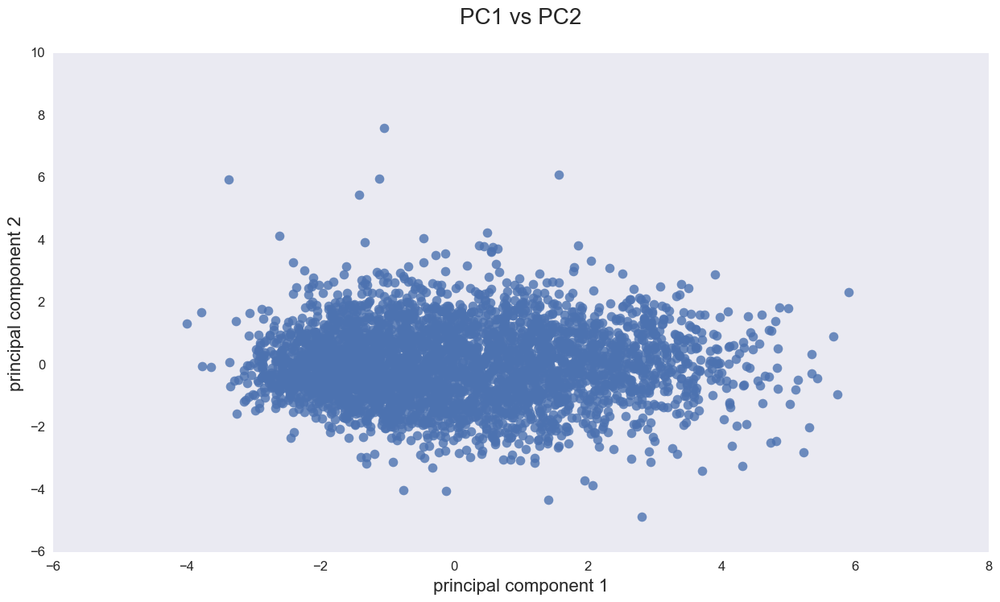

In [55]:
fig = plt.figure(figsize=(15,8))

ax = fig.gca()
ax = sns.regplot(Xt.iloc[:,0], Xt.iloc[:,1],
                 fit_reg=False, scatter_kws={'s':70}, ax=ax)

ax.set_xlabel('principal component 1', fontsize=16)
ax.set_ylabel('principal component 2', fontsize=16)


for tick in ax.xaxis.get_major_ticks():
    tick.label.set_fontsize(12) 
    
for tick in ax.yaxis.get_major_ticks():
    tick.label.set_fontsize(12) 
    
ax.set_title('PC1 vs PC2\n', fontsize=20)

plt.show()

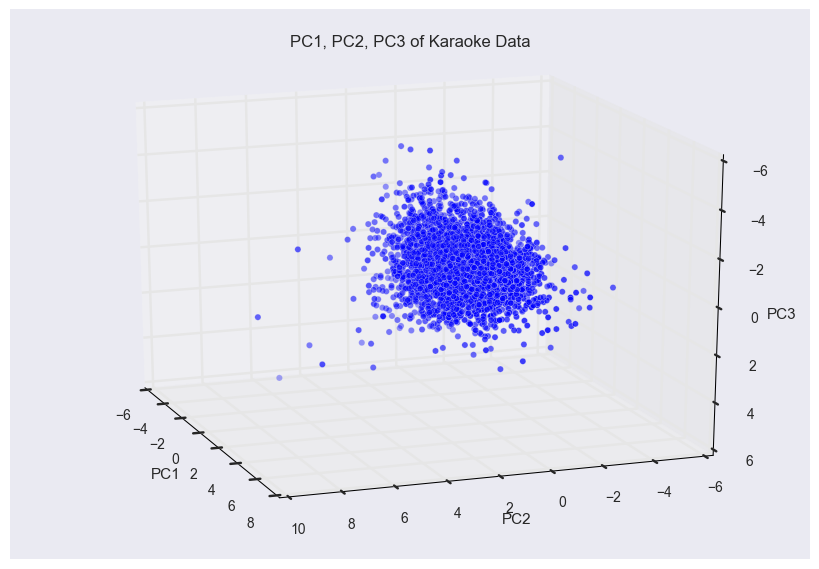

In [56]:
from mpl_toolkits.mplot3d import Axes3D

plt.close('all')
fig1 = plt.figure()
ax = Axes3D(fig1)
ax.scatter(xs = Xt['PC1'], ys = Xt['PC2'], zs = Xt['PC3'])

ax.set_xlabel('PC1')
ax.set_ylabel('PC2')
ax.set_zlabel('PC3')
ax.set_title('PC1, PC2, PC3 of Karaoke Data')

ax.azim = 200
ax.elev = 199

plt.show()

## K-MEANS FROM PCA

In [421]:
k = 9
kmeans = cluster.KMeans(n_clusters=k)
kmeans.fit(Xt)

KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
    n_clusters=9, n_init=10, n_jobs=1, precompute_distances='auto',
    random_state=None, tol=0.0001, verbose=0)

In [422]:
labels = kmeans.labels_
centroids = kmeans.cluster_centers_
inertia = kmeans.inertia_

In [423]:
centroids

array([[  2.33153745e+00,   7.40218151e-01,  -6.72557971e-01,
          2.08476359e-01,  -8.40351632e-01,  -7.82782988e-01,
          5.33857243e-01,   1.20648413e+00,   8.97935682e-01,
          4.25354498e-02,  -1.98033678e-02,  -2.50220601e-02,
          1.65412458e-02,   9.94117647e-01],
       [  5.79116133e-01,  -1.27826822e+00,  -2.28464481e-01,
         -2.77352538e-01,   1.44061824e-01,  -1.97663506e-01,
          1.47046495e-02,  -2.49596590e-01,  -7.28823096e-02,
          2.63246703e-01,   1.10676787e-01,   7.04212044e-03,
          3.88537391e-02,   1.20274914e-02],
       [  1.49781442e+00,  -1.20336810e+00,   8.16356027e-01,
          1.76330270e+00,  -1.63049684e+00,   4.11504024e+00,
         -7.48844312e-01,   1.06184586e+00,  -3.22312943e-01,
         -9.75764789e-01,   2.98304034e-01,  -1.00044294e-01,
          5.51450782e-02,   7.21644966e-16],
       [ -1.72574325e+00,  -4.60091517e-01,  -8.31135938e-01,
          2.77681033e+00,   1.27628673e+00,  -3.30628058e-0

In [424]:
inertia

26582.008810745465

In [425]:
# silhouette score change based on k (plot)

metrics.silhouette_score(Xt, labels, metric='euclidean')

0.13267664533699164

In [426]:
Xt['cluster']= pd.Series(labels)

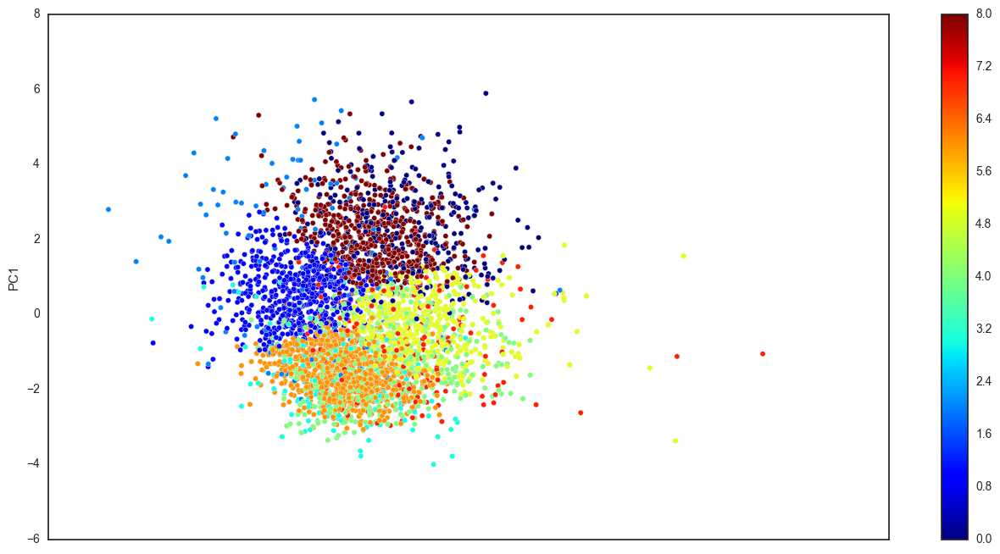

In [427]:
Xt.plot(kind='scatter', x='PC2',y='PC1', c=Xt.cluster.astype(np.float),figsize=(16,8), cmap = 'jet')

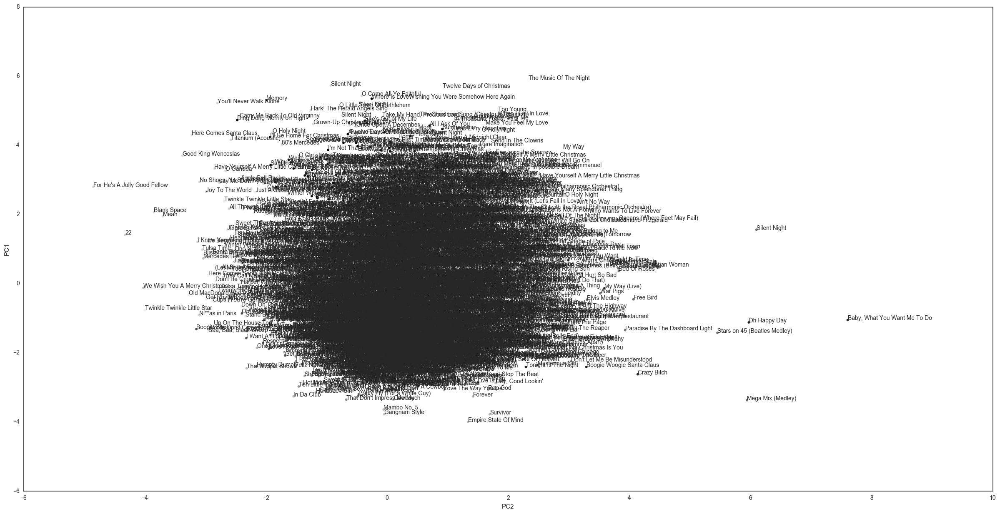

In [428]:
km_s = Xt.plot(kind='scatter', x='PC2',y='PC1', c=Xt.cluster.astype(np.float),figsize=(30,15))
for i, a in enumerate(af['Title']):
    km_s.annotate(a, (Xt.iloc[i].PC2, Xt.iloc[i].PC1))

# t-SNE

In [341]:
from scipy.cluster import hierarchy
from matplotlib import offsetbox
from sklearn import (manifold, decomposition, ensemble, discriminant_analysis, random_projection)

X_iso = manifold.Isomap(n_components=2).fit_transform(X)


In [342]:
def plot_embedding_color(X, title=None):
    x_min, x_max = np.min(X, 0), np.max(X, 0)
    X = (X - x_min) / (x_max - x_min)

    fig = plt.figure(figsize=(15,8))
    ax = plt.subplot(111)
    for i in range(X.shape[0]):
        plt.text(X[i, 0], X[i, 1], str(y[i]),
                 color=plt.cm.Set1(y[i] / 10.),
                 fontdict={'weight': 'bold', 'size': 9})

    if hasattr(offsetbox, 'AnnotationBbox'):
        # only print thumbnails with matplotlib > 1.0
        shown_images = np.array([[1., 1.]])  # just something big
        for i in range(X.shape[0]):
            dist = np.sum((X[i] - shown_images) ** 2, 1)
            if np.min(dist) < 4e-3:
                # don't show points that are too close
                continue
            shown_images = np.r_[shown_images, [X[i]]]
            imagebox = offsetbox.AnnotationBbox(
                offsetbox.OffsetImage(X.images[i], cmap=plt.cm.gray_r),
                X[i])
            ax.add_artist(imagebox)
    plt.xticks([]), plt.yticks([])
    if title is not None:
        plt.title(title)

AttributeError: 'numpy.ndarray' object has no attribute 'images'

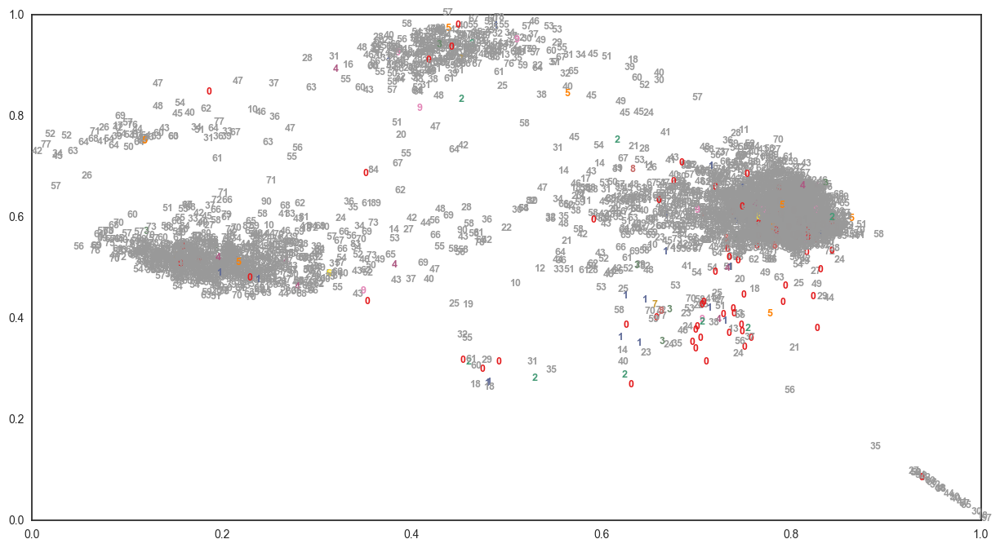

In [343]:
plot_embedding_color(X_iso,"Isomap projection")

## DBSCAN

In [308]:
from sklearn.cluster import DBSCAN
from sklearn.metrics import silhouette_score

In [309]:
db = DBSCAN(eps=0.3, min_samples=3)

In [310]:
db.fit(Xt)

DBSCAN(algorithm='auto', eps=0.3, leaf_size=30, metric='euclidean',
    min_samples=3, n_jobs=1, p=None)

In [311]:
core_samples = db.core_sample_indices_
dblabels = db.labels_

In [314]:
dblabels

array([-1, -1, -1, ..., -1, -1, -1])

In [344]:
# Can't get silhouette score (All -1 (noise))
silhouette_score(Xt, dblabels)

ValueError: Number of labels is 1. Valid values are 2 to n_samples - 1 (inclusive)

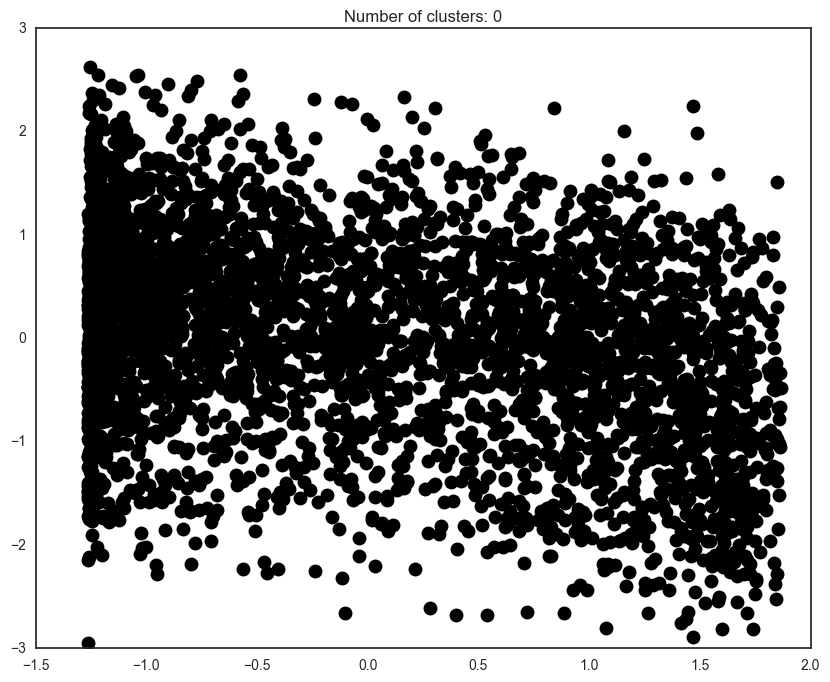

In [313]:
def plot_dbscan(db, Xt):
    fig = plt.figure(figsize=(10,8))
    
    core_samples_mask = np.zeros_like(db.labels_, dtype=bool)
    core_samples_mask[db.core_sample_indices_] = True
    labels = db.labels_

    # Number of clusters in labels, ignoring noise if present.
    n_clusters_ = len(set(labels)) - (1 if -1 in labels else 0)

    # Black removed and is used for noise instead.
    unique_labels = set(labels)
    colors = plt.cm.Spectral(np.linspace(0, 1, len(unique_labels)))
    for k, col in zip(unique_labels, colors):
        if k == -1:
            # Black used for noise.
            col = 'k'

        class_member_mask = (labels == k)

        xy = X[class_member_mask & core_samples_mask]
        plt.plot(xy[:, 0], xy[:, 1], 'o', markerfacecolor=col,
                 markeredgecolor='k', markersize=10)

        xy = X[class_member_mask & ~core_samples_mask]
        plt.plot(xy[:, 0], xy[:, 1], 'o', markerfacecolor=col,
                 markeredgecolor='k', markersize=10)
        

    plt.title('Number of clusters: %d' % n_clusters_);
    
plot_dbscan(db, Xt)

## HIERARCHICAL

In [82]:
from scipy.cluster import hierarchy
from scipy.spatial import distance as ssd
from scipy.cluster.hierarchy import dendrogram, linkage, cophenet, fcluster
from scipy.spatial import distance as ssd
from scipy.spatial.distance import pdist

In [83]:
Z = linkage(pdist(Xt), 'ward')

In [84]:
c, coph_dists = cophenet(Z, pdist(Xt))
c

0.6023118575447205

([], <a list of 0 Text xticklabel objects>)

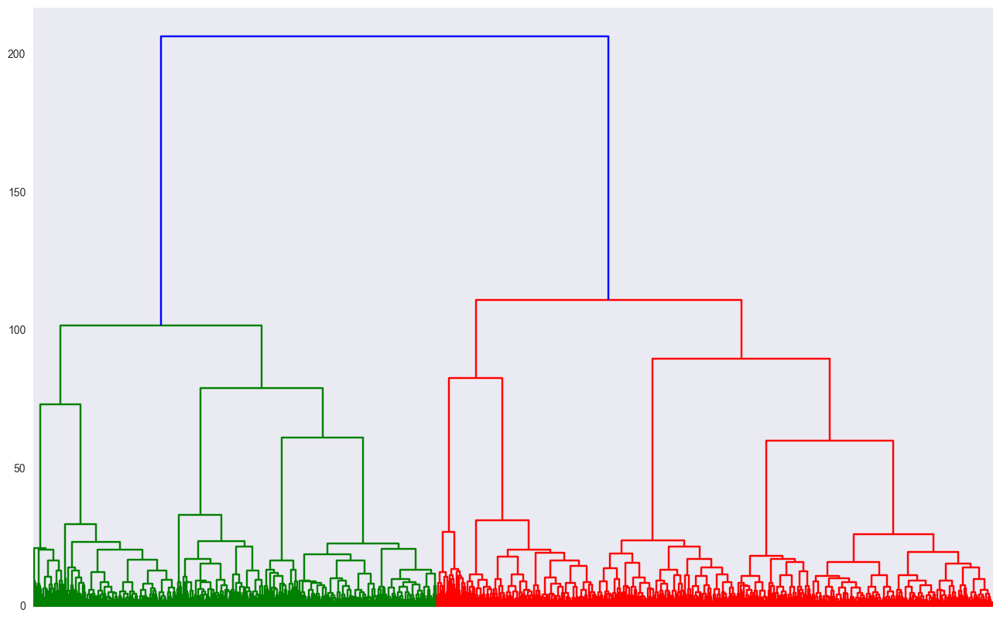

In [85]:
fig, ax = plt.subplots(figsize=(16,10))
dn = hierarchy.dendrogram(Z)
plt.xticks([])